- Import you data and perform basic data exploration phase
- Display general information about the dataset
- Create a pandas profiling reports to gain insights into the dataset
- Handle Missing and corrupted values
- Remove duplicates, if they exist
- Handle outliers, if they exist
- Encode categorical features
- Select your target variable and the features
- Split your dataset to training and test sets
- Build and train an SVM model on the training set
- Assess your model performance on the test set using relevant evaluation metrics
- Discuss with your cohort alternative ways to improve your model performance

In [54]:
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, classification_report, accuracy_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder, StandardScaler, QuantileTransformer
from sklearn.svm import SVR
from sklearn.model_selection import RandomizedSearchCV
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [14]:
df = pd.read_csv('C:\\Users\\Hp\\Desktop\\dataset\\Machine learning\\unsupervised learning\\Electric_cars_dataset.csv')
df.head()

,ID,VIN (1-10),County,City,State,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,Expected Price ($1k)
0,EV33174,5YJ3E1EC6L,Snohomish,LYNNWOOD,WA,98037.0,2020.0,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,32.0,109821694,POINT (-122.287614 47.83874),PUGET SOUND ENERGY INC,50
1,EV40247,JN1AZ0CP8B,Skagit,BELLINGHAM,WA,98229.0,2011.0,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,40.0,137375528,POINT (-122.414936 48.709388),PUGET SOUND ENERGY INC,15
2,EV12248,WBY1Z2C56F,Pierce,TACOMA,WA,98422.0,2015.0,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,27.0,150627382,POINT (-122.396286 47.293138),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,18
3,EV55713,1G1RD6E44D,King,REDMOND,WA,98053.0,2013.0,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,45.0,258766301,POINT (-122.024951 47.670286),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),33.9
4,EV28799,1G1FY6S05K,Pierce,PUYALLUP,WA,98375.0,2019.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,25.0,296998138,POINT (-122.321062 47.103797),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,41.78


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64353 entries, 0 to 64352
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   ID                                                 64353 non-null  object 
 1   VIN (1-10)                                         64353 non-null  object 
 2   County                                             64349 non-null  object 
 3   City                                               64344 non-null  object 
 4   State                                              64342 non-null  object 
 5   ZIP Code                                           64347 non-null  float64
 6   Model Year                                         64346 non-null  float64
 7   Make                                               64349 non-null  object 
 8   Model                                              64340 non-null  object 
 9   Electr

In [16]:
df.describe()

,ZIP Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID
count,64347.000000,64346.000000,64353.000000,64353.000000,64184.000000,6.435300e+04
mean,98143.452888,2018.186212,106.948985,2524.990754,29.951904,1.972905e+08
std,2856.064329,2.726742,104.093919,12402.895104,14.661124,1.069466e+08
min,745.000000,1993.000000,0.000000,0.000000,0.000000,4.385000e+03
25%,98052.000000,2017.000000,14.000000,0.000000,19.000000,1.372865e+08
50%,98121.000000,2018.000000,73.000000,0.000000,34.000000,1.753776e+08
75%,98370.000000,2021.000000,215.000000,0.000000,43.000000,2.299039e+08
max,99701.000000,2022.000000,337.000000,845000.000000,49.000000,4.789346e+08


In [17]:
new_df = df.copy()

In [18]:
new_df.head()

,ID,VIN (1-10),County,City,State,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,Expected Price ($1k)
0,EV33174,5YJ3E1EC6L,Snohomish,LYNNWOOD,WA,98037.0,2020.0,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,32.0,109821694,POINT (-122.287614 47.83874),PUGET SOUND ENERGY INC,50
1,EV40247,JN1AZ0CP8B,Skagit,BELLINGHAM,WA,98229.0,2011.0,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,40.0,137375528,POINT (-122.414936 48.709388),PUGET SOUND ENERGY INC,15
2,EV12248,WBY1Z2C56F,Pierce,TACOMA,WA,98422.0,2015.0,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,27.0,150627382,POINT (-122.396286 47.293138),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,18
3,EV55713,1G1RD6E44D,King,REDMOND,WA,98053.0,2013.0,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,45.0,258766301,POINT (-122.024951 47.670286),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),33.9
4,EV28799,1G1FY6S05K,Pierce,PUYALLUP,WA,98375.0,2019.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,25.0,296998138,POINT (-122.321062 47.103797),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,41.78


In [19]:
new_df = new_df.drop(columns=['ID', 'County','City','State','ZIP Code','Legislative District','Vehicle Location','Electric Utility'])

In [20]:
new_df.drop(columns=['VIN (1-10)'], inplace=True)

In [21]:
new_df

,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,DOL Vehicle ID,Expected Price ($1k)
0,2020.0,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,109821694,50
1,2011.0,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,137375528,15
2,2015.0,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,150627382,18
3,2013.0,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,258766301,33.9
4,2019.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,296998138,41.78
...,...,...,...,...,...,...,...,...,...
64348,2020.0,KIA,NIRO,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,239,0,156575107,33
64349,2013.0,TOYOTA,PRIUS PLUG-IN,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,6,0,211048701,13.3
64350,2018.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,135543411,22.857
64351,2017.0,PORSCHE,CAYENNE,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,0,192459907,45.7


In [22]:
new_df.isnull().sum()

Model Year                                            7
Make                                                  4
Model                                                13
Electric Vehicle Type                                 0
Clean Alternative Fuel Vehicle (CAFV) Eligibility     0
Electric Range                                        0
Base MSRP                                             0
DOL Vehicle ID                                        0
Expected Price ($1k)                                  0
dtype: int64

In [23]:
new_df[new_df['Model Year'].isnull()]

,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,DOL Vehicle ID,Expected Price ($1k)
18618,NaN,HYUNDAI,SONATA PLUG-IN HYBRID,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,27,34600,476776030,16.365
34663,NaN,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,192220731,57
35578,NaN,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208,69900,193870848,33.89
50803,NaN,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291,0,127404371,72
54860,NaN,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16,0,165842008,18.86
59409,NaN,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,169660508,64
62552,NaN,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,150168735,64


In [24]:
new_df.loc[23333, 'Make'] = 'NISSAN'
new_df.loc[27605, 'Make'] = 'TESLA'
new_df.loc[55367, 'Make'] = 'KIA'
new_df.loc[59308, 'Make'] = 'KIA'

In [25]:
group = new_df.groupby(by=['Make', 'Model']).count()
group.to_csv(r'C:\Users\Hp\Desktop\dataset\Machine learning\unsupervised learning\new_df_electric_cars_grouped.csv')


In [26]:
# Model , Model Year :
group_by = new_df.groupby(by=['Model'])['Model Year'].agg(lambda x : x.mode()[0])
group_by = group_by.reset_index()
group_by

,Model,Model Year
0,$16.36K,2017.0
1,330E,2017.0
2,500,2015.0
3,530E,2019.0
4,530E XDRIVE,2018.0
...,...,...
102,XC60 AWD,2018.0
103,XC60 AWD PHEV,2019.0
104,XC90,2017.0
105,XC90 AWD,2018.0


In [27]:
type(group_by)

pandas.core.frame.DataFrame

In [28]:
sonata = group_by[group_by['Model']== 'SONATA PLUG-IN HYBRID']['Model Year']
sonata.iloc[0]

np.float64(2016.0)

In [29]:
new_df.loc[18618, 'Model Year'] = group_by[group_by['Model']== 'SONATA PLUG-IN HYBRID']['Model Year'].iloc[0]


In [30]:
new_df.loc[34663, 'Model Year'] = group_by[group_by['Model']== 'MODEL 3']['Model Year'].iloc[0]
new_df.loc[35578, 'Model Year'] = group_by[group_by['Model']== 'MODEL S']['Model Year'].iloc[0]
new_df.loc[50803, 'Model Year'] = group_by[group_by['Model']== 'MODEL Y']['Model Year'].iloc[0]
new_df.loc[54860, 'Model Year'] = group_by[group_by['Model']== 'A3']['Model Year'].iloc[0]
new_df.loc[50803, 'Model Year'] = group_by[group_by['Model']== 'MODEL Y']['Model Year'].iloc[0]
new_df.loc[59409, 'Model Year'] = group_by[group_by['Model']== 'MODEL 3']['Model Year'].iloc[0]
new_df.loc[62552, 'Model Year'] = group_by[group_by['Model']== 'MODEL 3']['Model Year'].iloc[0]

In [31]:
new_df[new_df['Model Year'].isnull()]

,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,DOL Vehicle ID,Expected Price ($1k)


In [32]:
new_df[new_df['Model'].isnull()]

,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,DOL Vehicle ID,Expected Price ($1k)
2714,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,192602371,N/
4081,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,193046381,N/
13866,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,190318901,N/
14787,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,195263764,N/
16164,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,187155314,N/
22827,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,192317646,N/
26799,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,195845597,N/
28511,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,192539574,N/
31081,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,192962717,N/
37957,2022.0,FORD,NaN,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,193422764,N/


In [33]:
new_df.dropna(inplace=True)
new_df.isnull().sum()

Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
DOL Vehicle ID                                       0
Expected Price ($1k)                                 0
dtype: int64

In [34]:
new_df['Expected Price ($1k)'] = pd.to_numeric(new_df['Expected Price ($1k)'], errors='coerce')
new_df['Expected Price ($1k)'] = new_df['Expected Price ($1k)'] * 1000

In [35]:
new_df.shape

(64340, 9)

In [36]:
#new_df['Expected Price ($1k)'] = new_df['Expected Price ($1k)'] / 1000


In [37]:
rows, cols = 3, 3
make_plot = make_subplots(rows=rows, cols=cols)
for i, column in enumerate(new_df.columns):
    row = (i//cols)+1
    col = (i%cols)+1
    make_plot.add_trace(go.Box(y=new_df[column], name= column), row=row, col=col)
make_plot.update_layout(showlegend = False, height = 800, width = 1700 )

make_plot.show()


In [38]:
new_df.drop(columns = 'DOL Vehicle ID', inplace=True)

In [39]:
# Encoding Data :
cat_columns = new_df.select_dtypes(include='object')
Encoder = LabelEncoder()
for column in cat_columns :
    new_df[column] = Encoder.fit_transform(new_df[column])


In [40]:
correlation_matrix = new_df.corr()
correlation_matrix

,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Expected Price ($1k)
Model Year,1.000000,0.201909,0.014272,-0.203596,0.202405,-0.080429,-0.218364,0.538572
Make,0.201909,1.000000,0.160481,-0.501522,-0.060889,0.215201,0.022601,0.519787
Model,0.014272,0.160481,1.000000,0.258224,0.002186,-0.150083,0.040591,0.121368
Electric Vehicle Type,-0.203596,-0.501522,0.258224,1.000000,0.495441,-0.426392,0.046779,-0.399214
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0.202405,-0.060889,0.002186,0.495441,1.000000,-0.658704,0.033772,-0.055163
Electric Range,-0.080429,0.215201,-0.150083,-0.426392,-0.658704,1.000000,0.052876,0.214878
Base MSRP,-0.218364,0.022601,0.040591,0.046779,0.033772,0.052876,1.000000,-0.081020
Expected Price ($1k),0.538572,0.519787,0.121368,-0.399214,-0.055163,0.214878,-0.081020,1.000000


<Axes: >

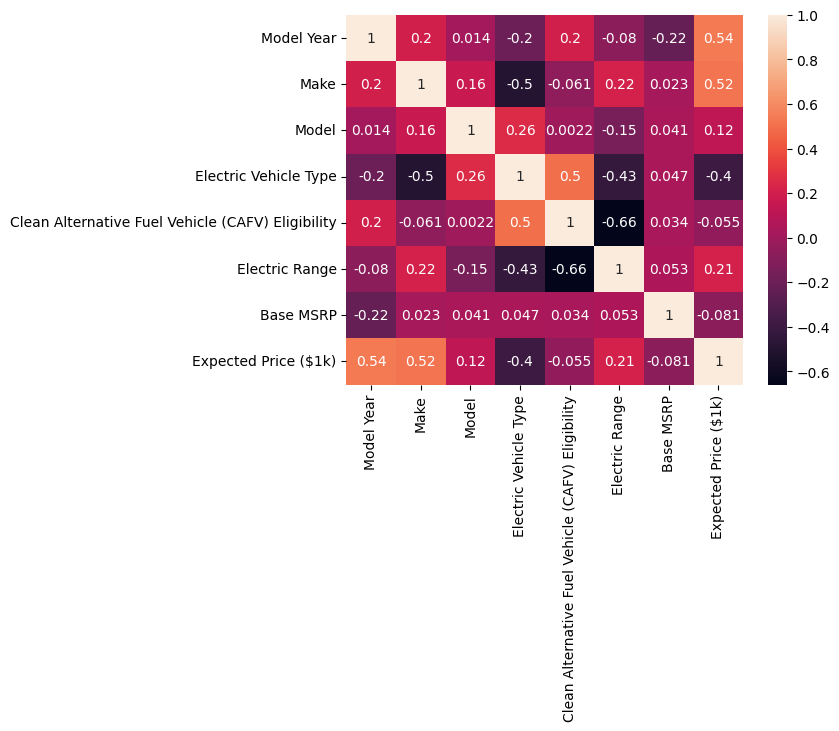

In [41]:
sns.heatmap(data=correlation_matrix, annot=True)

In [42]:
X = new_df.drop(columns=['Expected Price ($1k)'])
y = new_df['Expected Price ($1k)']

In [43]:
X.columns

Index(['Model Year', 'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP'],
      dtype='object')

In [44]:
scaler = StandardScaler()
scaled_x = scaler.fit_transform(X)
scaled_x = pd.DataFrame(scaled_x, columns=X.columns)

In [45]:
scaled_x

,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP
0,0.665581,0.779553,0.043426,-0.586588,-0.714049,1.931210,-0.203604
1,-2.635502,0.159594,-0.154024,-0.586588,-0.714049,-0.326256,-0.203604
2,-1.168354,-1.803610,-0.548924,-0.586588,-0.714049,-0.249406,-0.203604
3,-1.901928,-1.596957,1.968562,1.704775,-0.714049,-0.662474,-0.203604
4,0.298794,-1.596957,-2.029798,-0.586588,-0.714049,1.258774,-0.203604
...,...,...,...,...,...,...,...
64335,0.665581,-0.563692,0.240876,-0.586588,-0.714049,1.268380,-0.203604
64336,-1.901928,0.986206,0.635776,1.704775,1.998628,-0.969874,-0.203604
64337,-0.067993,-1.596957,-2.029798,-0.586588,-0.714049,1.258774,-0.203604
64338,-0.434780,0.366247,-1.782986,1.704775,1.998628,-0.893024,-0.203604


In [46]:
X_train, X_test, y_train, y_test = train_test_split(scaled_x, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((51472, 7), (12868, 7), (51472,), (12868,))

In [ ]:
# with colab test, i found the best param_dic
sv_regression = SVR()
param_dic = {'kernel': ['rbf'], 
              'degree': [2],    # poly
                'gamma': [0.1], # rbf
                'C' : [10]}  # sigmoid, poly
grid = GridSearchCV(estimator=sv_regression, param_grid=param_dic, scoring='r2', n_jobs=-1, cv=5)
grid.fit(X_train, y_train)

# a executer sur google colab (gpu)


GridSearchCV(cv=5, estimator=SVR(), n_jobs=-1,
             param_grid={'C': [10], 'degree': [2], 'gamma': [0.1],
                         'kernel': ['rbf']},
             scoring='r2')

In [49]:
y_pred = grid.predict(X_test)
y_pred

array([42286.06589952, 58568.62848739, 30590.24493928, ...,
       66595.16809604, 57409.81912582, 54020.32515892])

In [50]:
r2 = r2_score(y_test, y_pred)
MSE = mean_squared_error(y_test,y_pred)
print(f'r2_score :  {r2}')
print(f'Mean squred error : {MSE}')



r2_score :  0.6109888924726272
Mean squred error : 223500040.61263198


In [51]:
#Print the Best Parameters Found
print("Best Parameters Found:", grid.best_params_)

Best Parameters Found: {'C': 10, 'degree': 2, 'gamma': 0.1, 'kernel': 'rbf'}


In [52]:
# Best parameters and retrain the model


# Evaluate the performance
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Best Parameters: {grid.best_params_}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Best Parameters: {'C': 10, 'degree': 2, 'gamma': 0.1, 'kernel': 'rbf'}
Mean Absolute Error: 9787.278332074333
Mean Squared Error: 223500040.61263198
R-squared: 0.6109888924726272


Paramètres optimaux trouvés : C : 10 degré : 2 gamma : 0.1 kernel : rbf  avec COLAB
 - L'algorithme SVR utilise une régularisation assez forte (C=10) pour éviter le surapprentissage.
 - Le noyau RBF modélise les relations non linéaires. 
 - Le paramètre gamma à 0.1 contrôle l'influence de chaque point de donnée.

Interprétation des métriques :
- Mean Absolute Error (MAE) : Représente l'erreur moyenne en termes absolus, ce qui signifie que, en moyenne, les prédictions du modèle s'écartent de la valeur réelle de 9787.28 unités. Plus cette valeur est faible, mieux c'est.

- Mean Squared Error (MSE) : Mesure l'erreur quadratique moyenne, indiquant la moyenne des carrés des erreurs. Cette métrique est plus sensible aux grandes erreurs (d'où la valeur élevée). Elle est utile pour évaluer la dispersion des erreurs.

- Coefficient de détermination (R²) : Évalue la proportion de variance des données expliquée par le modèle. Une valeur de 0.6109 signifie que le modèle explique environ 61.09% de la variance des données, ce qui est acceptable mais laisse place à des améliorations.

Compte tenu de la difficulter a executer notre model sur VS Code, j'au utilise Colab qui a lui aussi pris beaucoup de temps a l'execution ... 
 

**Amelioration du modele**

- Jourer sur les hyper parametres C gama epsilon ....
- Feature Engineering 
- Combiner les prédictions de plusieurs modèles pour réduire les erreurs
- revoir la dataframe et chercher a eliminer d'autres colonnes pouvant affecter les resultats
